# CellDART Example Code: mouse brain 
## (10x Visium of anterior mouse brain + scRNA-seq data of mouse brain)

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
from CellDART import da_cellfraction
from CellDART.utils import random_mix
from sklearn.manifold import TSNE

## 1. Data load
### load scanpy data - 10x datasets

In [2]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

adata_spatial_anterior = sc.datasets.visium_sge(
    sample_id="V1_Mouse_Brain_Sagittal_Anterior"
)
adata_spatial_posterior = sc.datasets.visium_sge(
    sample_id="V1_Mouse_Brain_Sagittal_Posterior"
)

#Normalize
for adata in [
    adata_spatial_anterior,
    adata_spatial_posterior,
]:
    sc.pp.normalize_total(adata, inplace=True)

-----
anndata     0.8.0
scanpy      1.9.1
-----
CellDART                                    NA
PIL                                         9.2.0
aa8f2297d25b4dc6fd3d98411eb3ba53823c4f42    NA
absl                                        NA
asttokens                                   NA
astunparse                                  1.6.3
backcall                                    0.2.0
beta_ufunc                                  NA
binom_ufunc                                 NA
certifi                                     2022.06.15
cffi                                        1.15.1
charset_normalizer                          2.1.0
cycler                                      0.10.0
cython_runtime                              NA
dateutil                                    2.8.2
debugpy                                     1.6.2
decorator                                   5.1.1
defusedxml                                  0.7.1
entrypoints                                 0.4
executing         

/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


 (0:00:00)
normalizing counts per cell


/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)


### Single cell Data: GSE115746 
 - Download from GEO and use two files "GSE115746_cells_exon_counts.csv" and "GSE115746_complete_metadata_28706-cells.csv"

In [3]:
# adata_cortex = sc.read_csv('./data/GSE115746_cells_exon_counts.csv').T
# adata_cortex.write_h5ad('./data/GSE115746_cells_exon_counts.h5ad')

adata_cortex = sc.read_h5ad('./data/GSE115746_cells_exon_counts.h5ad')
adata_cortex_meta = pd.read_csv('./data/GSE115746_complete_metadata_28706-cells.csv', index_col=0)
adata_cortex_meta_ = adata_cortex_meta.loc[adata_cortex.obs.index,]

adata_cortex.obs = adata_cortex_meta_
adata_cortex.var_names_make_unique()  


In [15]:
adata_spatial_anterior.obsm['spatial']

array([[8500, 7474],
       [2788, 8552],
       [7950, 3163],
       ...,
       [6780, 5199],
       [4371, 8433],
       [3339, 6876]])

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:01:15)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


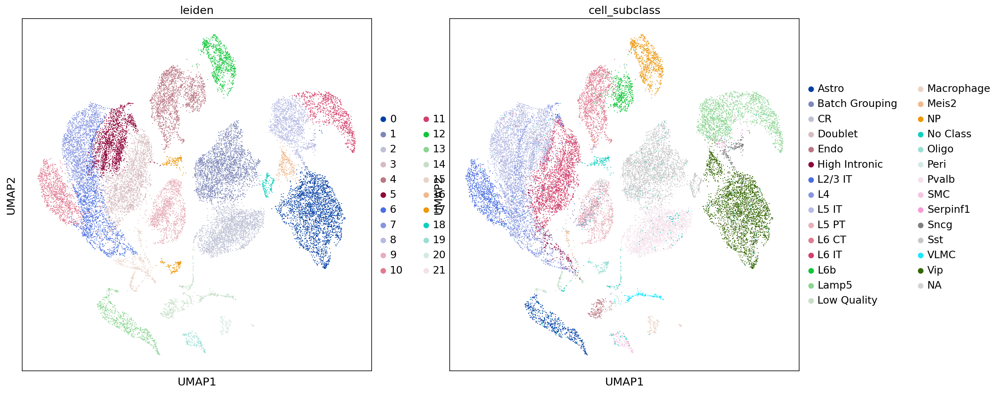

In [4]:
#Preprocessing
adata_cortex.var['mt'] = adata_cortex.var_names.str.startswith('Mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_cortex, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

sc.pp.normalize_total(adata_cortex)

#PCA and clustering : Known markers with 'cell_subclass'
sc.tl.pca(adata_cortex, svd_solver='arpack')
sc.pp.neighbors(adata_cortex, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_cortex)
sc.tl.leiden(adata_cortex, resolution = 0.5)
sc.pl.umap(adata_cortex, color=['leiden','cell_subclass'])


ranking genes


/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:417: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:418: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:417: RuntimeWarning: invalid value encountered in true_divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:417: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(me

/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:417: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:418: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:417: RuntimeWarning: invalid value encountered in true_divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:417: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(me

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:11:17)


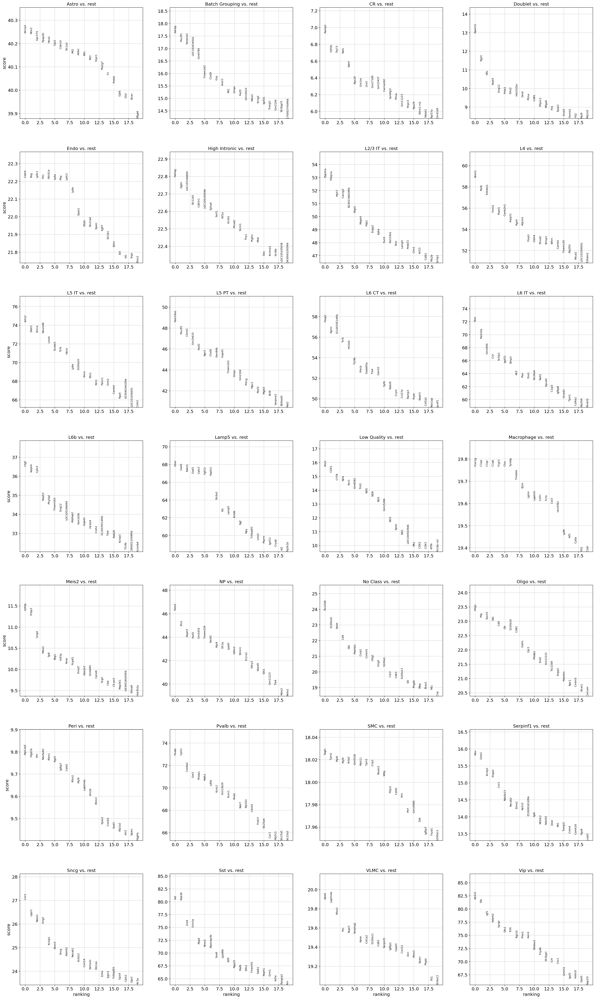

In [5]:
sc.tl.rank_genes_groups(adata_cortex, 'cell_subclass', method='wilcoxon')
sc.pl.rank_genes_groups(adata_cortex, n_genes=20, sharey=False)

In [6]:
genelists=adata_cortex.uns['rank_genes_groups']['names']
df_genelists = pd.DataFrame.from_records(genelists)
df_genelists.head(5)

,Astro,Batch Grouping,CR,Doublet,Endo,High Intronic,L2/3 IT,L4,L5 IT,L5 PT,...,No Class,Oligo,Peri,Pvalb,SMC,Serpinf1,Sncg,Sst,VLMC,Vip
0,Slc1a3,Sdcbp,Ramp1,Sparcl1,Cldn5,Ywhag,Ppp3ca,Nrxn1,Krt12,Fam19a1,...,Tsc22d4,Olig1,Atp13a5,Pvalb,Tagln,Nov,Cnr1,Sst,Apod,Ap1s2
1,Ntsr2,Pou3f1,H3f3b,Rgs5,Bsg,Dgkh,Fkbp1a,Rorb,Dkkl1,Pou3f1,...,S100a16,Pllp,Higd1b,Cplx1,Tpm2,Gsto1,Lppr1,Rab3b,Laptm4a,Vip
2,Gpr37l1,Serpine2,Trp73,Wls,Ly6c1,LOC105246694,Myh7,R3hdm1,Stx1a,Ckmt1,...,Apoe,Sox10,Vtn,Cox6a2,Myl6,Kcnip1,Npas1,Lhx6,Ifitm2,Igf1
3,Ppap2b,LOC102634502,Reln,Sept4,Flt1,Slc12a5,Cacng3,Fmnl1,Neurod6,Gm19410,...,Cd9,Dbi,Ndufa4l2,Got1,Myl9,Enpp2,Gng2,Grin3a,Ptn,Adarb2
4,Htra1,Gm6789,Ndnf,Gng12,Abcb1a,Cdk5r1,B230216N24Rik,Rspo1,Lmo4,Fezf2,...,Dbi,Cd9,Ifitm1,Phlda1,Acta2,Cnr1,Kcnip1,Rbp4,Nupr1,Synpr


In [7]:
num_markers=10
res_genes = []
for column in df_genelists.head(num_markers): 
    res_genes.extend(df_genelists.head(num_markers)[column].tolist())
res_genes_ = list(set(res_genes))

### Select same gene features 

In [8]:
adata_spatial_anterior.var_names_make_unique() 
inter_genes = [val for val in res_genes_ if val in adata_spatial_anterior.var.index]
print('Selected Feature Gene number',len(inter_genes))
adata_cortex = adata_cortex[:,inter_genes]

adata_spatial_anterior = adata_spatial_anterior[:,inter_genes]


Selected Feature Gene number 228


### Array of single cell & spatial data
- Single cell data with labels
- Spatial data without labels


In [9]:
mat_sc = adata_cortex.X
mat_sp = adata_spatial_anterior.X.todense()

df_sc = adata_cortex.obs

lab_sc_sub = df_sc.cell_subclass
sc_sub_dict = dict(zip(range(len(set(lab_sc_sub))), set(lab_sc_sub)))
sc_sub_dict2 = dict((y,x) for x,y in sc_sub_dict.items())
lab_sc_num = [sc_sub_dict2[ii] for ii in lab_sc_sub]
lab_sc_num = np.asarray(lab_sc_num, dtype='int')

## 2. Generate mixture from single cell data and preprocessing

In [10]:
sc_mix, lab_mix = random_mix(mat_sc, lab_sc_num, nmix=5, n_samples=5000)

def log_minmaxscale(arr):
    arrd = len(arr)
    arr = np.log1p(arr)
    return (arr-np.reshape(np.min(arr,axis=1), (arrd,1)))/np.reshape((np.max(arr, axis=1)-np.min(arr,axis=1)),(arrd,1))

sc_mix_s = log_minmaxscale(sc_mix)
mat_sp_s = log_minmaxscale(mat_sp)
mat_sc_s = log_minmaxscale(mat_sc)


In [11]:
print(mat_sp_s.shape, mat_sc_s.shape, sc_mix_s.shape)

(2695, 228) (23178, 228) (5000, 228)


## 3. Training: Adversarial domain adaptation for cell fraction estimation
### Parameters
- alpha: loss weights for adversarial learning for pooling domain classifier
- alpha_lr: learning rate for training domain classifier  (alpha_lr *0.001)
- emb_dim: embedding dimension (feature dimension)
- batch_size : batch size for the training
- n_iterations: iteration number of adversarial training
- initial_train: if true, classifier model is trained firstly before adversarial domain adaptation
- initial_train_epochs: number of epochs for inital training



In [12]:
embs, clssmodel = da_cellfraction.train(sc_mix_s, lab_mix, mat_sp_s, 
                                        alpha=1, alpha_lr=5, emb_dim = 64, batch_size = 512,
                                        n_iterations = 2000,
                                        initial_train=True,
                                        initial_train_epochs=10)

Train on 5000 samples
Epoch 1/10
5000/5000 [==============================] - 0s 47us/sample - loss: 1.2654 - mae: 0.0397
Epoch 2/10
5000/5000 [==============================] - 0s 18us/sample - loss: 0.7065 - mae: 0.0279
Epoch 3/10
5000/5000 [==============================] - 0s 19us/sample - loss: 0.5902 - mae: 0.0245
Epoch 4/10
5000/5000 [==============================] - 0s 19us/sample - loss: 0.5238 - mae: 0.0225
Epoch 5/10
5000/5000 [==============================] - 0s 18us/sample - loss: 0.4757 - mae: 0.0211
Epoch 6/10
5000/5000 [==============================] - 0s 17us/sample - loss: 0.4405 - mae: 0.0201
Epoch 7/10
5000/5000 [==============================] - 0s 18us/sample - loss: 0.4116 - mae: 0.0192
Epoch 8/10
5000/5000 [==============================] - 0s 18us/sample - loss: 0.3868 - mae: 0.0185
Epoch 9/10
5000/5000 [==============================] - 0s 17us/sample - loss: 0.3648 - mae: 0.0178
Epoch 10/10
5000/5000 [==============================] - 0s 18us/sample - loss

/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/keras/engine/training_v1.py:2045: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


Iteration 99, source loss =  1.952, discriminator acc = 0.650
Iteration 199, source loss =  1.500, discriminator acc = 0.057
Iteration 299, source loss =  1.773, discriminator acc = 0.097
Iteration 399, source loss =  2.286, discriminator acc = 0.472
Iteration 499, source loss =  1.596, discriminator acc = 0.104
Iteration 599, source loss =  1.643, discriminator acc = 0.206
Iteration 699, source loss =  0.978, discriminator acc = 0.046
Iteration 799, source loss =  1.071, discriminator acc = 0.255
Iteration 899, source loss =  0.896, discriminator acc = 0.695
Iteration 999, source loss =  0.618, discriminator acc = 0.116
Iteration 1099, source loss =  0.610, discriminator acc = 0.160
Iteration 1199, source loss =  0.769, discriminator acc = 0.656
Iteration 1299, source loss =  1.358, discriminator acc = 0.650
Iteration 1399, source loss =  0.600, discriminator acc = 0.163
Iteration 1499, source loss =  1.056, discriminator acc = 0.533
Iteration 1599, source loss =  0.562, discriminator

## 4. Predict cell fraction of spots and visualization

In [13]:
pred_sp = clssmodel.predict(mat_sp_s)

def plot_cellfraction(visnum):
    adata_spatial_anterior.obs['Pred_label'] = pred_sp[:,visnum]
    sc.pl.spatial(
        adata_spatial_anterior,
        img_key="hires",
        color='Pred_label',
        palette='Set1',
        size=1.5,
        legend_loc=None,
        title = sc_sub_dict[visnum])

print(sc_sub_dict)


{0: nan, 1: 'Low Quality', 2: 'SMC', 3: 'Pvalb', 4: 'Meis2', 5: 'L6 IT', 6: 'NP', 7: 'High Intronic', 8: 'L6 CT', 9: 'CR', 10: 'Endo', 11: 'Lamp5', 12: 'L5 IT', 13: 'L5 PT', 14: 'Serpinf1', 15: 'Macrophage', 16: 'Oligo', 17: 'L2/3 IT', 18: 'No Class', 19: 'Astro', 20: 'L6b', 21: 'L4', 22: 'Sst', 23: 'Sncg', 24: 'Peri', 25: 'Batch Grouping', 26: 'Doublet', 27: 'Vip', 28: 'VLMC'}


/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


/tmp/ipykernel_1330/1035120905.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_spatial_anterior.obs['Pred_label'] = pred_sp[:,visnum]


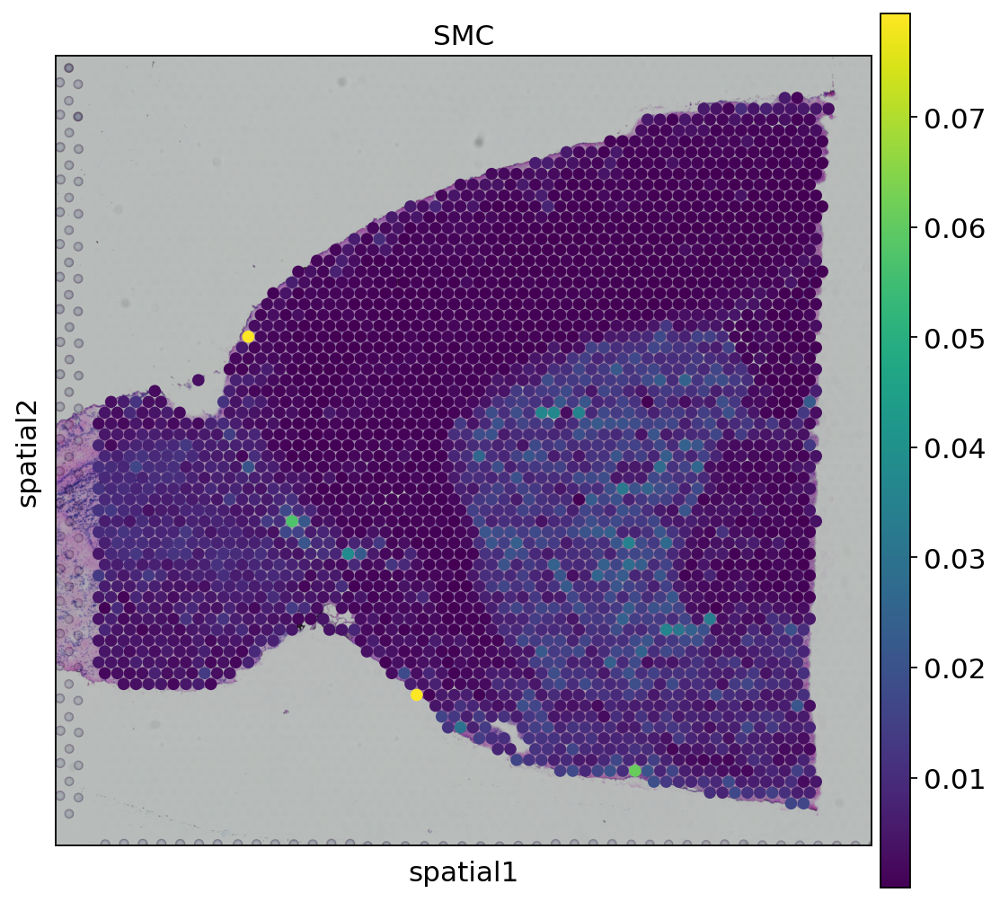

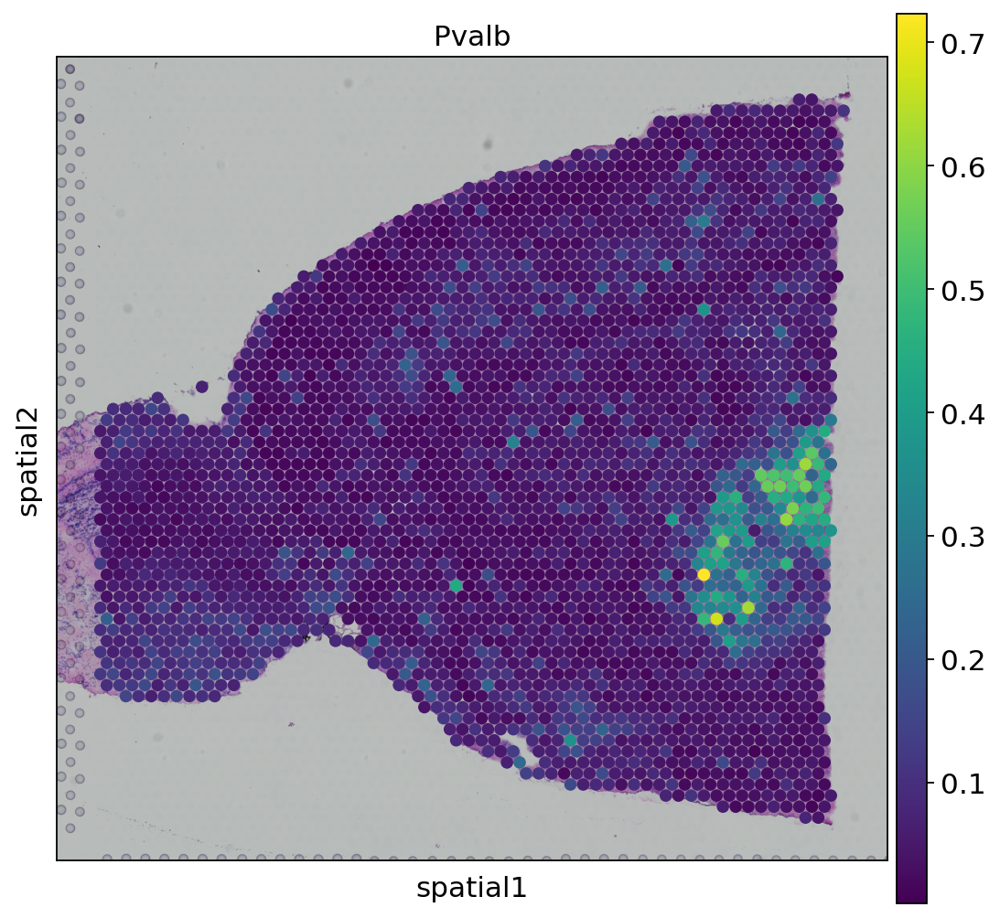

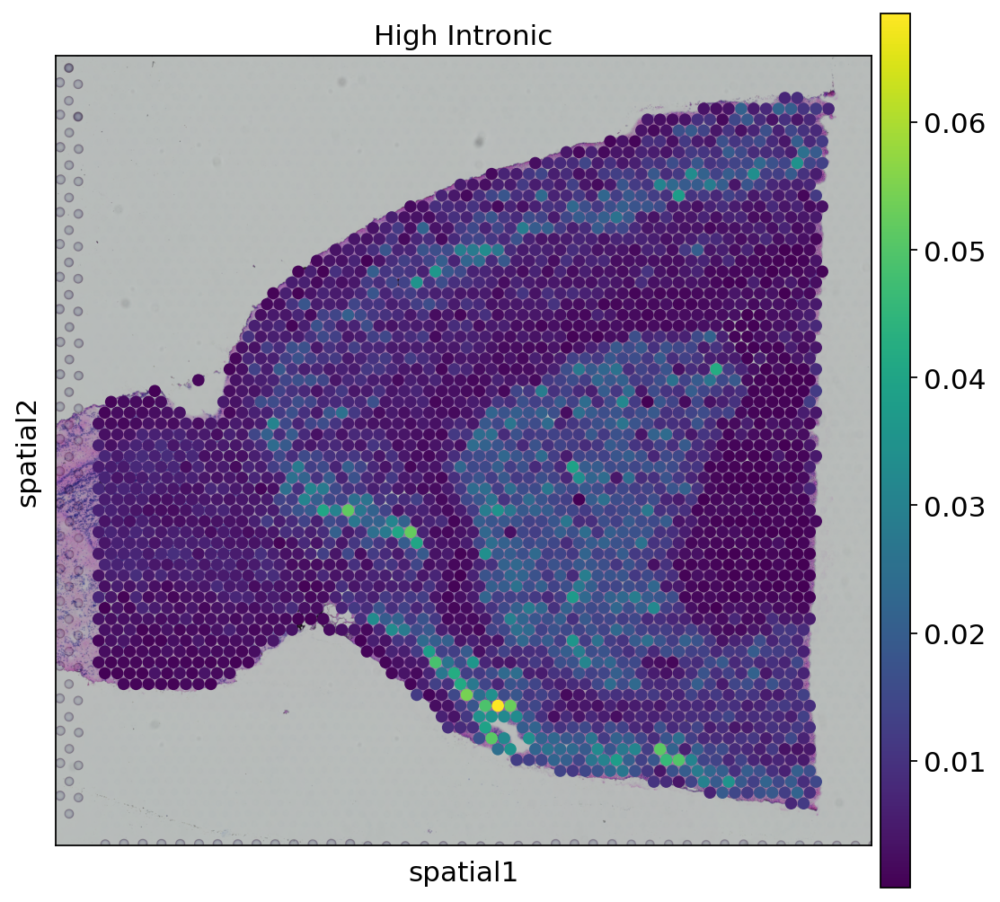

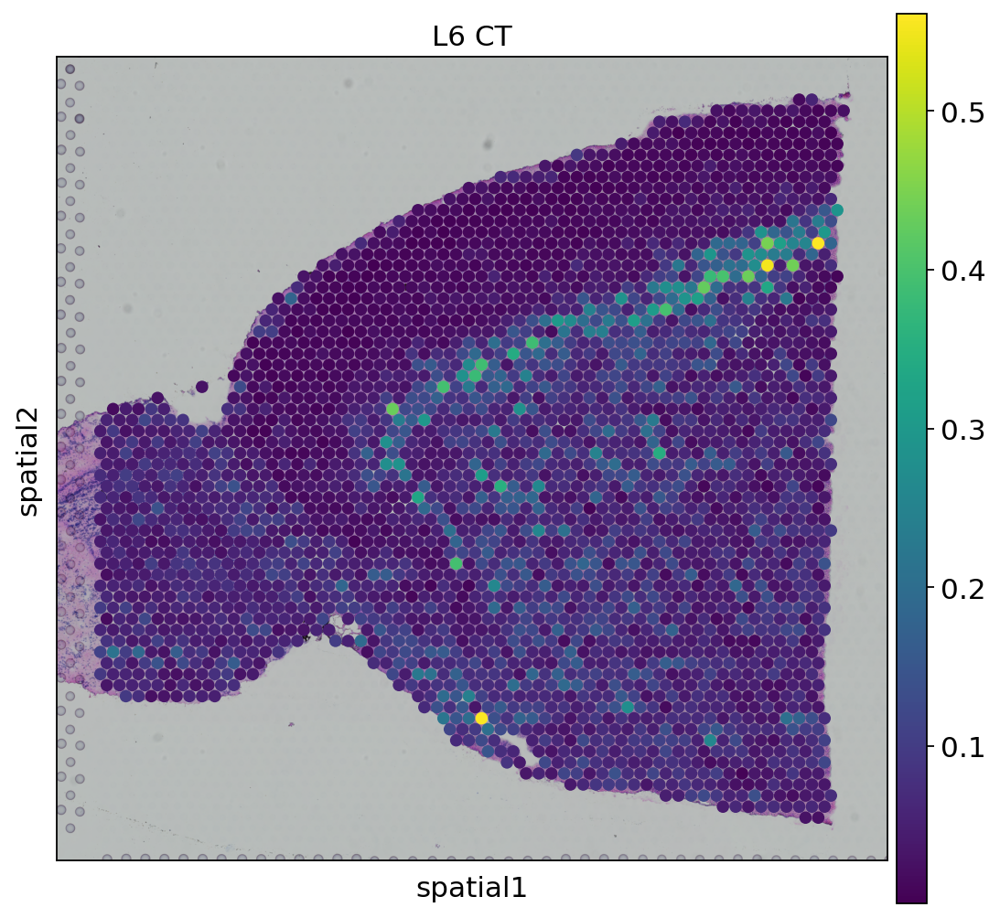

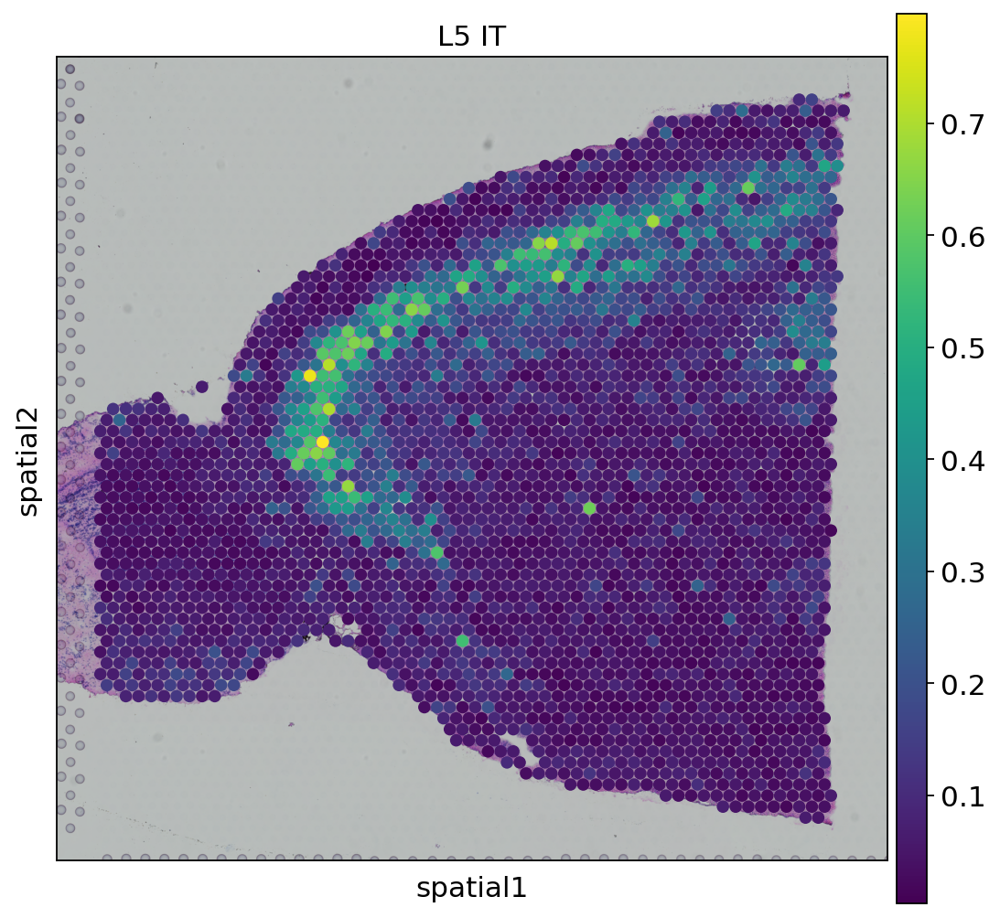

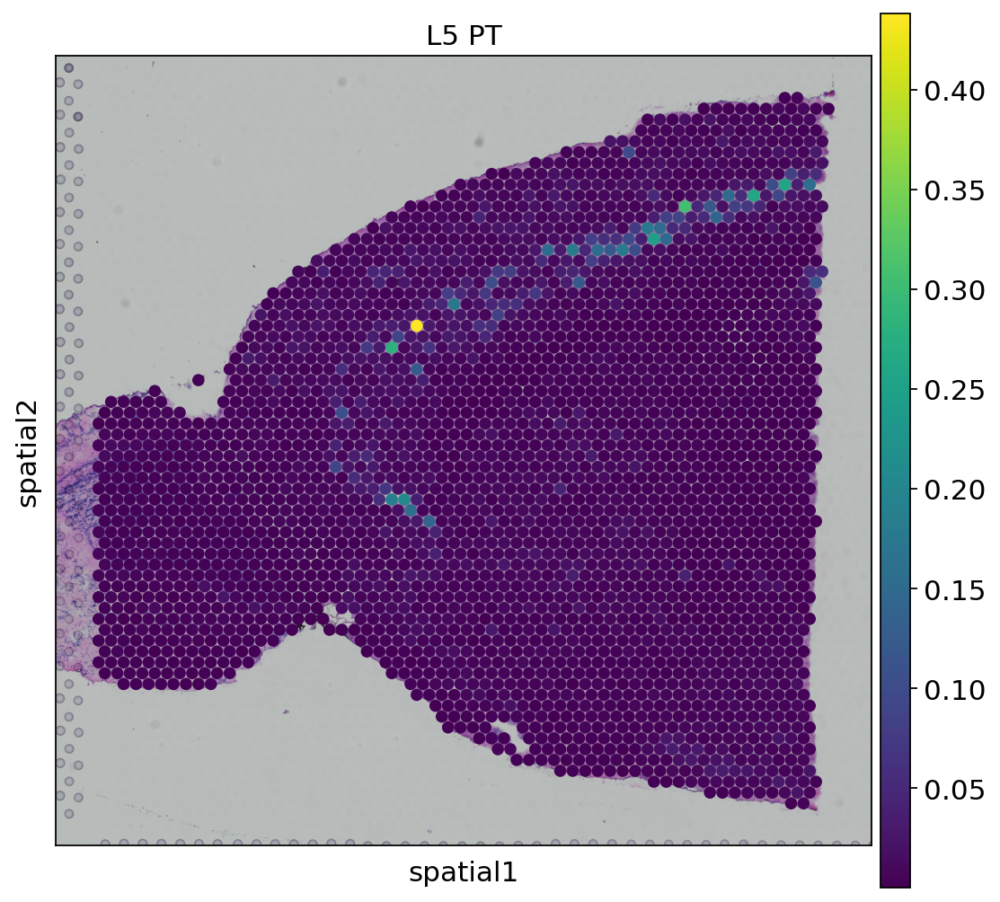

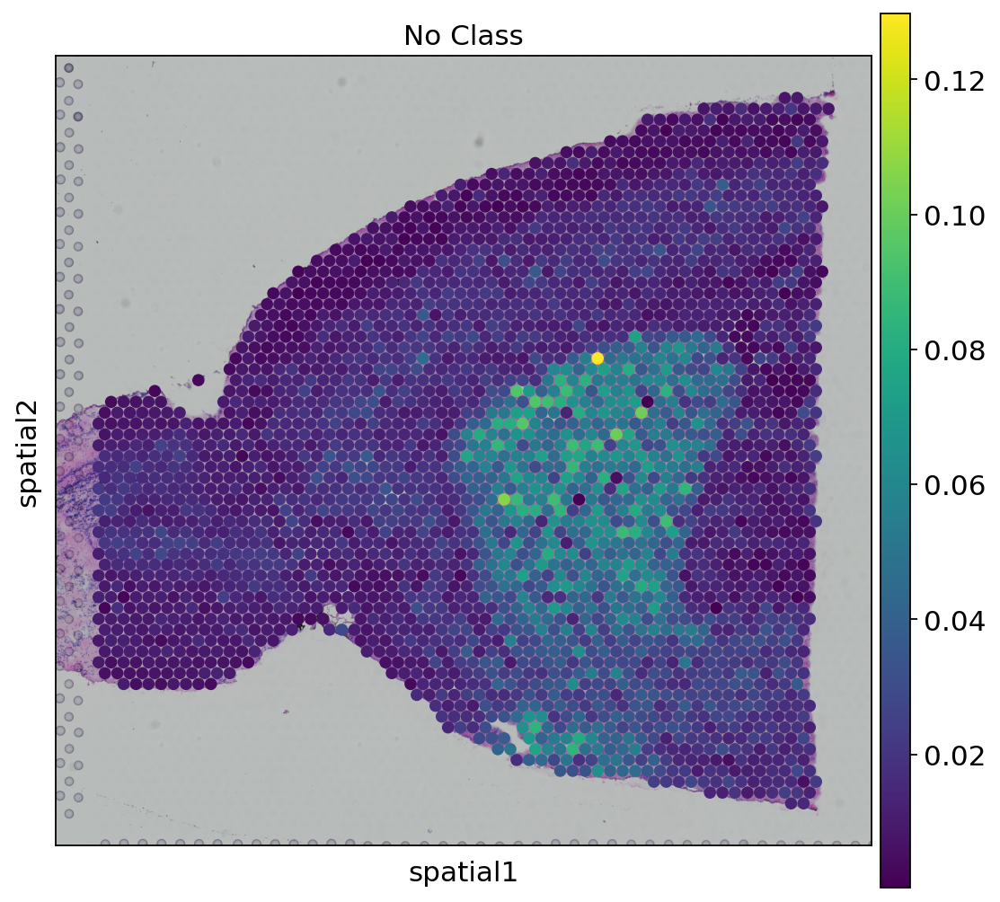

In [14]:
numlist = [2,3,7,8,12,13,18]

for num in numlist:
    plot_cellfraction(num)

- cf. Prediction of Mixture (pseudospots)


/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


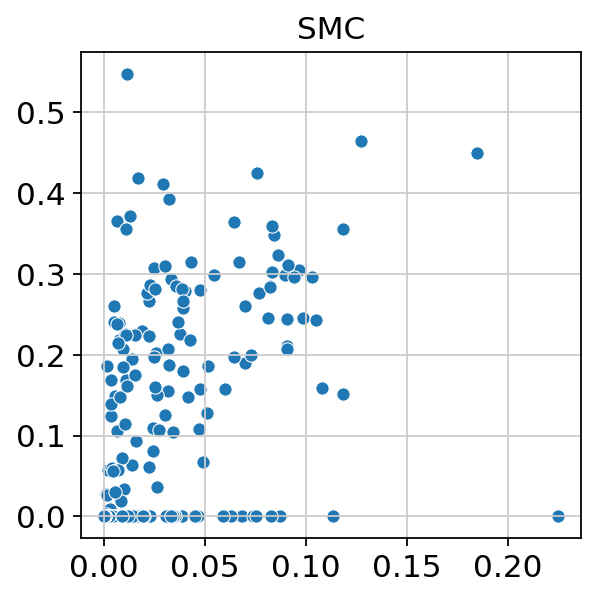

/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


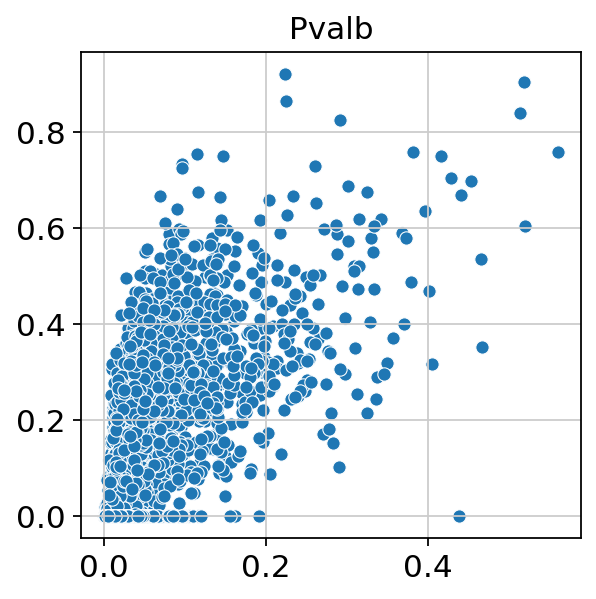

/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


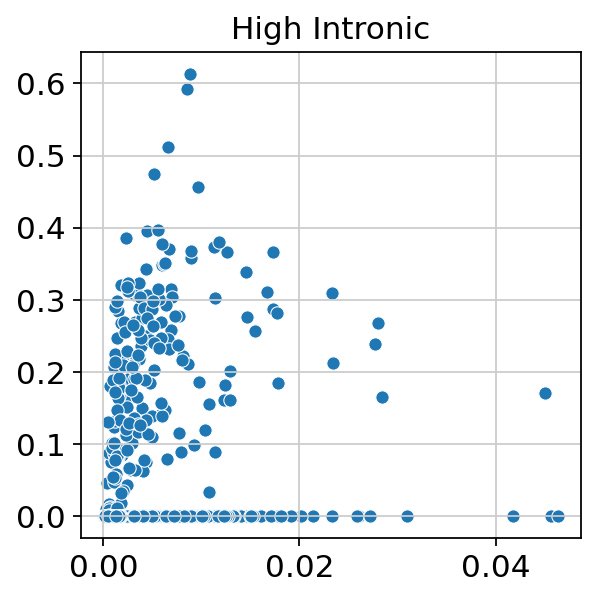

/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


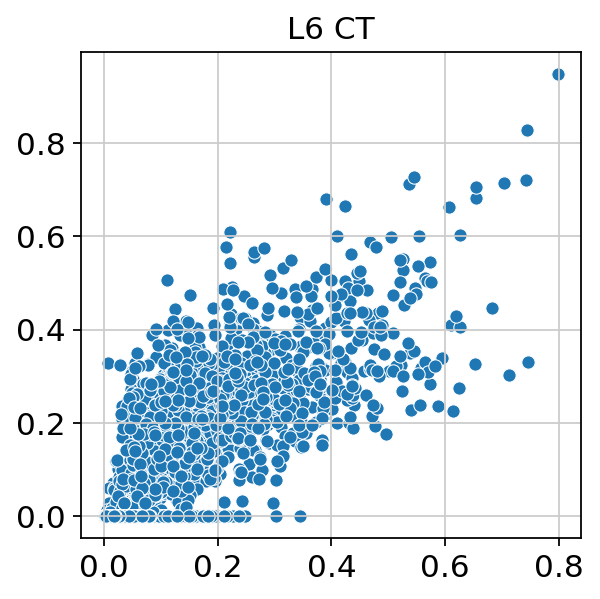

/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


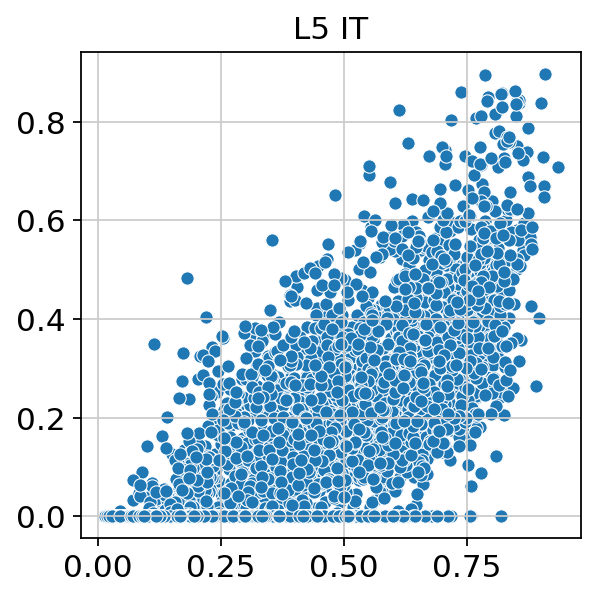

/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


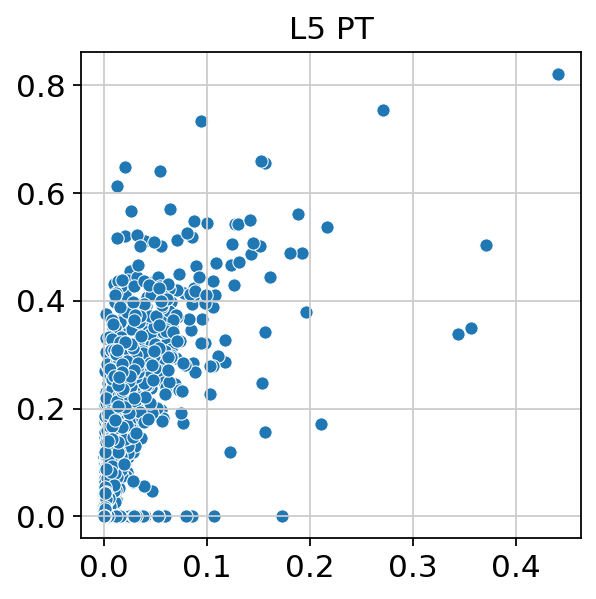

/home/wma/miniconda3/envs/CellDART/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


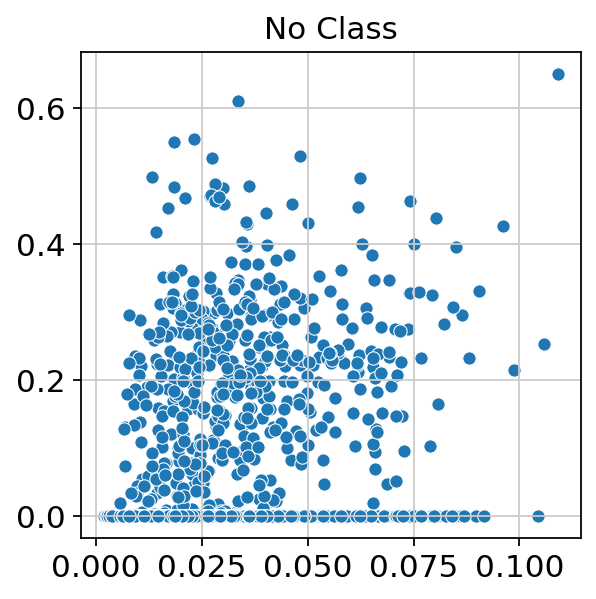

In [15]:
pred_mix = clssmodel.predict(sc_mix_s)

for visnum in numlist:
    plt.figure(figsize=(4,4))
    sns.scatterplot(pred_mix[:,visnum], lab_mix[:,visnum]).set_title(sc_sub_dict[visnum])
    plt.show()

In [16]:

print('\n'.join(f'{m.__name__} {m.__version__}' for m in globals().values() if getattr(m, '__version__', None)))

scanpy 1.9.1
pandas 1.4.3
numpy 1.20.3
seaborn 0.11.2


In [17]:
import keras
keras.__version__

'2.9.0'